In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

In [2]:
!pip install geopy


### unifier le DF

In [3]:
train=pd.read_csv('src/train.csv') # on concat nos 2 fichiers pour refaire un jeu de données complet
test=pd.read_csv('src/test.csv')
df=pd.concat([train,test]).reset_index(drop=True)
df

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,0x6909,JAPRES01DEL01,35,4.6,26.905190,75.810753,27.015190,75.920753,27-03-2022,21:35:00,21:45:00,conditions Sunny,Jam,1,Snack,scooter,1,No,Metropolitian,NaN
56988,0x443b,JAPRES11DEL01,33,4.9,26.902940,75.793007,26.912940,75.803007,11-03-2022,11:40:00,11:45:00,conditions Sandstorms,High,1,Drinks,scooter,1,No,Metropolitian,NaN
56989,0x1ea5,SURRES11DEL03,NaN,NaN,21.157735,72.768778,21.217735,72.828778,11-03-2022,NaN,21:05:00,conditions NaN,NaN,3,Drinks,scooter,1,No,Metropolitian,NaN
56990,0x22d4,VADRES03DEL02,27,4.7,22.320000,73.170000,22.450000,73.300000,06-03-2022,18:35:00,18:40:00,conditions Sandstorms,Medium,0,Meal,motorcycle,0,No,Metropolitian,NaN


In [4]:
df.to_csv('src/food_delivery.csv',index=False) # on sauvegarde le fichier concaténé en csv


In [5]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56992 entries, 0 to 56991
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           56992 non-null  object 
 1   Delivery_person_ID           56992 non-null  object 
 2   Delivery_person_Age          56992 non-null  object 
 3   Delivery_person_Ratings      56992 non-null  object 
 4   Restaurant_latitude          56992 non-null  float64
 5   Restaurant_longitude         56992 non-null  float64
 6   Delivery_location_latitude   56992 non-null  float64
 7   Delivery_location_longitude  56992 non-null  float64
 8   Order_Date                   56992 non-null  object 
 9   Time_Orderd                  56992 non-null  object 
 10  Time_Order_picked            56992 non-null  object 
 11  Weatherconditions            56992 non-null  object 
 12  Road_traffic_density         56992 non-null  object 
 13  Vehicle_conditio

In [6]:
df.shape

(56992, 20)

In [7]:
df.head(5)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [8]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,56992,56992,0x4607,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_ID,56992,1320,INDORES13DEL02,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Age,56992,23,35,2809,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Ratings,56992,29,4.8,8938,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Restaurant_latitude,56992.0,NaN,NaN,NaN,17.034171,8.186784,-30.905562,12.933284,18.55144,22.728163,30.914057
Restaurant_longitude,56992.0,NaN,NaN,NaN,70.26492,22.861487,-88.400467,73.170283,75.897429,78.045359,88.433452
Delivery_location_latitude,56992.0,NaN,NaN,NaN,17.486049,7.325665,0.01,12.989166,18.636258,22.785536,31.054057
Delivery_location_longitude,56992.0,NaN,NaN,NaN,70.897002,21.034559,0.01,73.293329,76.002471,78.107053,88.563452
Order_Date,56992,44,19-03-2022,1440,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time_Orderd,56992,177,NaN,2175,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df.isna().sum() # valeurs manquantes 
df.isna().sum() / len(df) * 100 # valeurs manquantes  en %


ID                              0.000000
Delivery_person_ID              0.000000
Delivery_person_Age             0.000000
Delivery_person_Ratings         0.000000
Restaurant_latitude             0.000000
Restaurant_longitude            0.000000
Delivery_location_latitude      0.000000
Delivery_location_longitude     0.000000
Order_Date                      0.000000
Time_Orderd                     0.000000
Time_Order_picked               0.000000
Weatherconditions               0.000000
Road_traffic_density            0.000000
Vehicle_condition               0.000000
Type_of_order                   0.000000
Type_of_vehicle                 0.000000
multiple_deliveries             0.000000
Festival                        0.000000
City                            0.000000
Time_taken(min)                20.001053
dtype: float64

In [10]:
df['Time_taken(min)']=df['Time_taken(min)'].str.replace('(min)','').astype(float) # on enleve le min et on change le type de la colonne


In [11]:
sample=pd.read_csv('src/Sample_Submission.csv')
sample

,ID,Time_taken (min)
0,0x2318,25.668333
1,0x3474,27.881667
2,0x9420,27.023333
3,0x72ee,28.153333
4,0xa759,21.018333
...,...,...
11394,0x6909,21.972500
11395,0x443b,29.390000
11396,0x1ea5,26.244167
11397,0x22d4,23.752500


In [12]:
df_merged=pd.merge(df,sample, how='left', on='ID')
df_merged

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,...,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min),Time_taken (min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,...,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,24.0,NaN
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,...,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,33.0,NaN
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,...,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,26.0,NaN
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,...,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,21.0,NaN
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,...,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,30.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,0x6909,JAPRES01DEL01,35,4.6,26.905190,75.810753,27.015190,75.920753,27-03-2022,21:35:00,...,conditions Sunny,Jam,1,Snack,scooter,1,No,Metropolitian,NaN,21.972500
56988,0x443b,JAPRES11DEL01,33,4.9,26.902940,75.793007,26.912940,75.803007,11-03-2022,11:40:00,...,conditions Sandstorms,High,1,Drinks,scooter,1,No,Metropolitian,NaN,29.390000
56989,0x1ea5,SURRES11DEL03,NaN,NaN,21.157735,72.768778,21.217735,72.828778,11-03-2022,NaN,...,conditions NaN,NaN,3,Drinks,scooter,1,No,Metropolitian,NaN,26.244167
56990,0x22d4,VADRES03DEL02,27,4.7,22.320000,73.170000,22.450000,73.300000,06-03-2022,18:35:00,...,conditions Sandstorms,Medium,0,Meal,motorcycle,0,No,Metropolitian,NaN,23.752500


In [13]:
df_merged['Time_taken(min)'].fillna(df_merged['Time_taken (min)'],inplace=True) #
#ce code remplit les valeurs manquantes dans la colonne 'Time_taken(min)' du DataFrame df_merged 
# en utilisant les valeurs de la colonne 'Time_taken (min)', et ces modifications sont apportées directement au DataFrame df_merged.

/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/3666026439.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_merged['Time_taken(min)'].fillna(df_merged['Time_taken (min)'],inplace=True) #


In [14]:
df_merged=df_merged.drop(columns=['Time_taken (min)'])


In [15]:
df_merged.to_csv('df_merged.csv')


In [16]:
df_merged.describe(include='all')


,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
count,56992,56992,56992,56992,56992.000000,56992.000000,56992.000000,56992.000000,56992,56992,56992,56992,56992,56992.000000,56992,56992,56992,56992,56992,56992.000000
unique,56992,1320,23,29,NaN,NaN,NaN,NaN,44,177,193,7,5,NaN,4,4,5,3,4,NaN
top,0x4607,INDORES13DEL02,35,4.8,NaN,NaN,NaN,NaN,19-03-2022,NaN,21:30:00,conditions Fog,Low,NaN,Snack,motorcycle,1,No,Metropolitian,NaN
freq,1,72,2809,8938,NaN,NaN,NaN,NaN,1440,2175,601,9422,19358,NaN,14348,33044,35224,55600,42590,NaN
mean,NaN,NaN,NaN,NaN,17.034171,70.264920,17.486049,70.897002,NaN,NaN,NaN,NaN,NaN,1.024968,NaN,NaN,NaN,NaN,NaN,26.282614
std,NaN,NaN,NaN,NaN,8.186784,22.861487,7.325665,21.034559,NaN,NaN,NaN,NaN,NaN,0.839171,NaN,NaN,NaN,NaN,NaN,9.196978
min,NaN,NaN,NaN,NaN,-30.905562,-88.400467,0.010000,0.010000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,10.000000
25%,NaN,NaN,NaN,NaN,12.933284,73.170283,12.989166,73.293329,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,19.000000
50%,NaN,NaN,NaN,NaN,18.551440,75.897429,18.636258,76.002471,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,25.000000
75%,NaN,NaN,NaN,NaN,22.728163,78.045359,22.785536,78.107053,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,32.000000


In [17]:
df_merged.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,56992,56992,0x4607,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_ID,56992,1320,INDORES13DEL02,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Age,56992,23,35,2809,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Ratings,56992,29,4.8,8938,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Restaurant_latitude,56992.0,NaN,NaN,NaN,17.034171,8.186784,-30.905562,12.933284,18.55144,22.728163,30.914057
Restaurant_longitude,56992.0,NaN,NaN,NaN,70.26492,22.861487,-88.400467,73.170283,75.897429,78.045359,88.433452
Delivery_location_latitude,56992.0,NaN,NaN,NaN,17.486049,7.325665,0.01,12.989166,18.636258,22.785536,31.054057
Delivery_location_longitude,56992.0,NaN,NaN,NaN,70.897002,21.034559,0.01,73.293329,76.002471,78.107053,88.563452
Order_Date,56992,44,19-03-2022,1440,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time_Orderd,56992,177,NaN,2175,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df.info() # on a des valeurs manquantes ds df


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56992 entries, 0 to 56991
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           56992 non-null  object 
 1   Delivery_person_ID           56992 non-null  object 
 2   Delivery_person_Age          56992 non-null  object 
 3   Delivery_person_Ratings      56992 non-null  object 
 4   Restaurant_latitude          56992 non-null  float64
 5   Restaurant_longitude         56992 non-null  float64
 6   Delivery_location_latitude   56992 non-null  float64
 7   Delivery_location_longitude  56992 non-null  float64
 8   Order_Date                   56992 non-null  object 
 9   Time_Orderd                  56992 non-null  object 
 10  Time_Order_picked            56992 non-null  object 
 11  Weatherconditions            56992 non-null  object 
 12  Road_traffic_density         56992 non-null  object 
 13  Vehicle_conditio

In [19]:
df_merged.isna().any() # on a plus de valeurs manquantes ds le merged


ID                             False
Delivery_person_ID             False
Delivery_person_Age            False
Delivery_person_Ratings        False
Restaurant_latitude            False
Restaurant_longitude           False
Delivery_location_latitude     False
Delivery_location_longitude    False
Order_Date                     False
Time_Orderd                    False
Time_Order_picked              False
Weatherconditions              False
Road_traffic_density           False
Vehicle_condition              False
Type_of_order                  False
Type_of_vehicle                False
multiple_deliveries            False
Festival                       False
City                           False
Time_taken(min)                False
dtype: bool

In [20]:
df_merged.replace('NaN ', np.nan, inplace=True) #on remplace le string Nan en vrai valeur nan


In [21]:
df_merged.isna().sum()


ID                                0
Delivery_person_ID                0
Delivery_person_Age            2345
Delivery_person_Ratings        2415
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    2175
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density            755
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries            1231
Festival                        293
City                           1524
Time_taken(min)                   0
dtype: int64

In [22]:
df_merged.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56992 entries, 0 to 56991
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           56992 non-null  object 
 1   Delivery_person_ID           56992 non-null  object 
 2   Delivery_person_Age          54647 non-null  object 
 3   Delivery_person_Ratings      54577 non-null  object 
 4   Restaurant_latitude          56992 non-null  float64
 5   Restaurant_longitude         56992 non-null  float64
 6   Delivery_location_latitude   56992 non-null  float64
 7   Delivery_location_longitude  56992 non-null  float64
 8   Order_Date                   56992 non-null  object 
 9   Time_Orderd                  54817 non-null  object 
 10  Time_Order_picked            56992 non-null  object 
 11  Weatherconditions            56992 non-null  object 
 12  Road_traffic_density         56237 non-null  object 
 13  Vehicle_conditio

In [23]:
df_merged.to_csv('src/df_clean.csv')


In [24]:
df = pd.read_csv('src/df_clean.csv')

In [25]:
df.head(5)

,Unnamed: 0,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,...,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,...,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24.0
1,1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,...,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33.0
2,2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,...,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26.0
3,3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,...,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21.0
4,4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,...,13:45:00,conditions Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30.0


In [26]:
df

,Unnamed: 0,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,...,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,...,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24.000000
1,1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,...,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33.000000
2,2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,...,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26.000000
3,3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,...,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21.000000
4,4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,...,13:45:00,conditions Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,56987,0x6909,JAPRES01DEL01,35.0,4.6,26.905190,75.810753,27.015190,75.920753,27-03-2022,...,21:45:00,conditions Sunny,Jam,1,Snack,scooter,1.0,No,Metropolitian,21.972500
56988,56988,0x443b,JAPRES11DEL01,33.0,4.9,26.902940,75.793007,26.912940,75.803007,11-03-2022,...,11:45:00,conditions Sandstorms,High,1,Drinks,scooter,1.0,No,Metropolitian,29.390000
56989,56989,0x1ea5,SURRES11DEL03,NaN,NaN,21.157735,72.768778,21.217735,72.828778,11-03-2022,...,21:05:00,conditions NaN,NaN,3,Drinks,scooter,1.0,No,Metropolitian,26.244167
56990,56990,0x22d4,VADRES03DEL02,27.0,4.7,22.320000,73.170000,22.450000,73.300000,06-03-2022,...,18:40:00,conditions Sandstorms,Medium,0,Meal,motorcycle,0.0,No,Metropolitian,23.752500


### CLEANING

In [27]:
#Remplacer conditions par rien
df['Weatherconditions']=df['Weatherconditions'].str.replace('conditions','')

In [28]:
#Spliter city_code de Delivery_person_ID
df['City_code']=df['Delivery_person_ID'].str.split('RES', expand=True)[0]

In [29]:
df

,Unnamed: 0,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,...,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min),City_code
0,0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,...,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24.000000,INDO
1,1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,...,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33.000000,BANG
2,2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,...,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26.000000,BANG
3,3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,...,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21.000000,COIMB
4,4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,...,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30.000000,CHEN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,56987,0x6909,JAPRES01DEL01,35.0,4.6,26.905190,75.810753,27.015190,75.920753,27-03-2022,...,Sunny,Jam,1,Snack,scooter,1.0,No,Metropolitian,21.972500,JAP
56988,56988,0x443b,JAPRES11DEL01,33.0,4.9,26.902940,75.793007,26.912940,75.803007,11-03-2022,...,Sandstorms,High,1,Drinks,scooter,1.0,No,Metropolitian,29.390000,JAP
56989,56989,0x1ea5,SURRES11DEL03,NaN,NaN,21.157735,72.768778,21.217735,72.828778,11-03-2022,...,NaN,NaN,3,Drinks,scooter,1.0,No,Metropolitian,26.244167,SUR
56990,56990,0x22d4,VADRES03DEL02,27.0,4.7,22.320000,73.170000,22.450000,73.300000,06-03-2022,...,Sandstorms,Medium,0,Meal,motorcycle,0.0,No,Metropolitian,23.752500,VAD


In [30]:
#On enlève juste le unnamed
df=df.drop('Unnamed: 0', axis=1)

In [31]:
#On check les duplicate values 
df.duplicated().value_counts()

False    56992
Name: count, dtype: int64

In [32]:
#Résoudre l'erreur des 'NaN ' et remplacement par 'NaN' 
df.replace('NaN ',np.nan, inplace=True)
df.replace(' NaN',np.nan, inplace=True)
df.replace('nan',np.nan, inplace=True)
df.replace('nan ',np.nan, inplace=True)

In [33]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56992 entries, 0 to 56991
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           56992 non-null  object 
 1   Delivery_person_ID           56992 non-null  object 
 2   Delivery_person_Age          54647 non-null  float64
 3   Delivery_person_Ratings      54577 non-null  float64
 4   Restaurant_latitude          56992 non-null  float64
 5   Restaurant_longitude         56992 non-null  float64
 6   Delivery_location_latitude   56992 non-null  float64
 7   Delivery_location_longitude  56992 non-null  float64
 8   Order_Date                   56992 non-null  object 
 9   Time_Orderd                  54817 non-null  object 
 10  Time_Order_picked            56992 non-null  object 
 11  Weatherconditions            56218 non-null  object 
 12  Road_traffic_density         56237 non-null  object 
 13  Vehicle_conditio

In [34]:
def update_datatype(df):
    df['Delivery_person_Age'] = df['Delivery_person_Age'].astype('float64')
    df['Delivery_person_Ratings']=df['Delivery_person_Ratings'].astype('float64')
    df['multiple_deliveries']=df['multiple_deliveries'].astype('float64')
    df['Order_Date']=pd.to_datetime(df['Order_Date'], format="%d-%m-%Y")

update_datatype(df)

In [35]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56992 entries, 0 to 56991
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           56992 non-null  object        
 1   Delivery_person_ID           56992 non-null  object        
 2   Delivery_person_Age          54647 non-null  float64       
 3   Delivery_person_Ratings      54577 non-null  float64       
 4   Restaurant_latitude          56992 non-null  float64       
 5   Restaurant_longitude         56992 non-null  float64       
 6   Delivery_location_latitude   56992 non-null  float64       
 7   Delivery_location_longitude  56992 non-null  float64       
 8   Order_Date                   56992 non-null  datetime64[ns]
 9   Time_Orderd                  54817 non-null  object        
 10  Time_Order_picked            56992 non-null  object        
 11  Weatherconditions            56218 non-nu

In [36]:
df.head(5)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,...,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min),City_code
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,...,Sunny,High,2,Snack,motorcycle,0.0,No,Urban,24.0,INDO
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,...,Stormy,Jam,2,Snack,scooter,1.0,No,Metropolitian,33.0,BANG
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,...,Sandstorms,Low,0,Drinks,motorcycle,1.0,No,Urban,26.0,BANG
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,...,Sunny,Medium,0,Buffet,motorcycle,1.0,No,Metropolitian,21.0,COIMB
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,...,Cloudy,High,1,Snack,scooter,1.0,No,Metropolitian,30.0,CHEN


In [37]:
df.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
ID,56992,56992,0x4607,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_ID,56992,1320,INDORES13DEL02,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Age,54647.0,NaN,NaN,NaN,29.557176,15.0,25.0,30.0,35.0,50.0,5.811533
Delivery_person_Ratings,54577.0,NaN,NaN,NaN,4.633582,1.0,4.5,4.7,4.9,6.0,0.336603
Restaurant_latitude,56992.0,NaN,NaN,NaN,17.034171,-30.905562,12.933284,18.55144,22.728163,30.914057,8.186784
Restaurant_longitude,56992.0,NaN,NaN,NaN,70.26492,-88.400467,73.170283,75.897429,78.045359,88.433452,22.861487
Delivery_location_latitude,56992.0,NaN,NaN,NaN,17.486049,0.01,12.989166,18.636258,22.785536,31.054057,7.325665
Delivery_location_longitude,56992.0,NaN,NaN,NaN,70.897002,0.01,73.293329,76.002471,78.107053,88.563452,21.034559
Order_Date,56992,NaN,NaN,NaN,2022-03-13 16:37:43.896687360,2022-02-11 00:00:00,2022-03-04 00:00:00,2022-03-15 00:00:00,2022-03-27 00:00:00,2022-04-06 00:00:00,NaN
Time_Orderd,54817,176,21:55:00,572,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Vérification de l'existence de valeurs non nulles


In [38]:
df.isna().sum()


ID                                0
Delivery_person_ID                0
Delivery_person_Age            2345
Delivery_person_Ratings        2415
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    2175
Time_Order_picked                 0
Weatherconditions               774
Road_traffic_density            755
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries            1231
Festival                        293
City                           1524
Time_taken(min)                   0
City_code                         0
dtype: int64

In [39]:
df.describe(include='all').T


,count,unique,top,freq,mean,min,25%,50%,75%,max,std
ID,56992,56992,0x4607,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_ID,56992,1320,INDORES13DEL02,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Delivery_person_Age,54647.0,NaN,NaN,NaN,29.557176,15.0,25.0,30.0,35.0,50.0,5.811533
Delivery_person_Ratings,54577.0,NaN,NaN,NaN,4.633582,1.0,4.5,4.7,4.9,6.0,0.336603
Restaurant_latitude,56992.0,NaN,NaN,NaN,17.034171,-30.905562,12.933284,18.55144,22.728163,30.914057,8.186784
Restaurant_longitude,56992.0,NaN,NaN,NaN,70.26492,-88.400467,73.170283,75.897429,78.045359,88.433452,22.861487
Delivery_location_latitude,56992.0,NaN,NaN,NaN,17.486049,0.01,12.989166,18.636258,22.785536,31.054057,7.325665
Delivery_location_longitude,56992.0,NaN,NaN,NaN,70.897002,0.01,73.293329,76.002471,78.107053,88.563452,21.034559
Order_Date,56992,NaN,NaN,NaN,2022-03-13 16:37:43.896687360,2022-02-11 00:00:00,2022-03-04 00:00:00,2022-03-15 00:00:00,2022-03-27 00:00:00,2022-04-06 00:00:00,NaN
Time_Orderd,54817,176,21:55:00,572,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
#Remplacement des valeurs nulles :
def handle_null_values(df):
    df['Delivery_person_Age'].fillna(np.random.choice(df['Delivery_person_Age']),inplace=True)
    df['Delivery_person_Ratings'].fillna(df['Delivery_person_Ratings'].median(),inplace=True)
    df['Weatherconditions'].fillna(np.random.choice(df['Weatherconditions']),inplace=True)
    df['Road_traffic_density'].fillna(df['Road_traffic_density'].mode()[0], inplace=True)
    df['multiple_deliveries'].fillna(df['multiple_deliveries'].mode()[0],inplace=True)
    df['Festival'].fillna(df['Festival'].mode()[0],inplace=True)
    df['City'].fillna(df['City'].mode()[0],inplace=True)
handle_null_values(df)

/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/485392624.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Delivery_person_Age'].fillna(np.random.choice(df['Delivery_person_Age']),inplace=True)
/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/485392624.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate ob

In [41]:
df.isna().sum()


ID                                0
Delivery_person_ID                0
Delivery_person_Age               0
Delivery_person_Ratings           0
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    2175
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density              0
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries               0
Festival                          0
City                              0
Time_taken(min)                   0
City_code                         0
dtype: int64

In [42]:
#Convertir time ordered et time order picked en date time
df['Time_Orderd']=pd.to_datetime(df['Time_Orderd'])
df['Time_Order_picked']=pd.to_datetime(df['Time_Order_picked'])

/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/4126424470.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Time_Orderd']=pd.to_datetime(df['Time_Orderd'])
/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/4126424470.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Time_Order_picked']=pd.to_datetime(df['Time_Order_picked'])


In [43]:
#Calculer la différence entre les deux 
df['Time_Difference'] = df['Time_Order_picked'] - df['Time_Orderd']
#Convertir la différence en minutes seulement 
df['Time_Difference']=df['Time_Difference'].dt.seconds//60

In [44]:
#Enlever NaN de la colonne Time Preparation
df['Time_Difference'].fillna(df['Time_Difference'].median(), inplace=True)

/var/folders/58/1g58gkyn5gg8gxkls_r08wqc0000gn/T/ipykernel_55269/3398209072.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Time_Difference'].fillna(df['Time_Difference'].median(), inplace=True)


In [45]:
df.columns


Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Order_Date', 'Time_Orderd',
       'Time_Order_picked', 'Weatherconditions', 'Road_traffic_density',
       'Vehicle_condition', 'Type_of_order', 'Type_of_vehicle',
       'multiple_deliveries', 'Festival', 'City', 'Time_taken(min)',
       'City_code', 'Time_Difference'],
      dtype='object')

In [46]:
#Maintenant on a une base propre sans NaN
df.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age               0
Delivery_person_Ratings           0
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    2175
Time_Order_picked                 0
Weatherconditions                 0
Road_traffic_density              0
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries               0
Festival                          0
City                              0
Time_taken(min)                   0
City_code                         0
Time_Difference                   0
dtype: int64

In [47]:
#Suppression des colonnes Time Orderd, on n'en a plus besoin
df=df.drop(columns='Time_Orderd')

In [48]:
df.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
Time_taken(min)                0
City_code                      0
Time_Difference                0
dtype: int64

In [49]:
from geopy.distance import geodesic # on cree une colonne distance entre le resto et la deli location
def calculate_distance(df):
    df['distance']=np.zeros(len(df))
    restaurant_coordinates=df[['Restaurant_latitude','Restaurant_longitude']].to_numpy()
    delivery_location_coordinates=df[['Delivery_location_latitude','Delivery_location_longitude']].to_numpy()
    df['distance']=np.array([geodesic(restaurant, delivery) for restaurant, delivery in zip (restaurant_coordinates, delivery_location_coordinates)])

calculate_distance(df)

In [50]:
df

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Order_picked,...,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min),City_code,Time_Difference,distance
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,2024-04-05 11:45:00,...,2,Snack,motorcycle,0.0,No,Urban,24.000000,INDO,15.0,3.0207366434610647 km
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,2024-04-05 19:50:00,...,2,Snack,scooter,1.0,No,Metropolitian,33.000000,BANG,5.0,20.143736910348597 km
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,2024-04-05 08:45:00,...,0,Drinks,motorcycle,1.0,No,Urban,26.000000,BANG,15.0,1.549692932239404 km
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,2024-04-05 18:10:00,...,0,Buffet,motorcycle,1.0,No,Metropolitian,21.000000,COIMB,10.0,7.774496620087613 km
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,2024-04-05 13:45:00,...,1,Snack,scooter,1.0,No,Metropolitian,30.000000,CHEN,15.0,6.197897916874956 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,0x6909,JAPRES01DEL01,35.0,4.6,26.905190,75.810753,27.015190,75.920753,2022-03-27,2024-04-05 21:45:00,...,1,Snack,scooter,1.0,No,Metropolitian,21.972500,JAP,10.0,16.365894271420093 km
56988,0x443b,JAPRES11DEL01,33.0,4.9,26.902940,75.793007,26.912940,75.803007,2022-03-11,2024-04-05 11:45:00,...,1,Drinks,scooter,1.0,No,Metropolitian,29.390000,JAP,5.0,1.4881081439039618 km
56989,0x1ea5,SURRES11DEL03,23.0,4.7,21.157735,72.768778,21.217735,72.828778,2022-03-11,2024-04-05 21:05:00,...,3,Drinks,scooter,1.0,No,Metropolitian,26.244167,SUR,10.0,9.107658657262554 km
56990,0x22d4,VADRES03DEL02,27.0,4.7,22.320000,73.170000,22.450000,73.300000,2022-03-06,2024-04-05 18:40:00,...,0,Meal,motorcycle,0.0,No,Metropolitian,23.752500,VAD,5.0,19.65858405722505 km


In [51]:
#transformer distance en chaine de caractères pour éviter des erreurs dans la conversion
df['distance']=df['distance'].astype("str")

In [52]:
#Remplacement de km par rien 
df['distance']=df['distance'].str.replace(' km','').astype(float)

In [53]:
#limiter nombres après la virgule à 2 
df['distance']=round(df['distance'],2)

In [54]:
df


,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Order_picked,...,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min),City_code,Time_Difference,distance
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,2024-04-05 11:45:00,...,2,Snack,motorcycle,0.0,No,Urban,24.000000,INDO,15.0,3.02
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,2024-04-05 19:50:00,...,2,Snack,scooter,1.0,No,Metropolitian,33.000000,BANG,5.0,20.14
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,2024-04-05 08:45:00,...,0,Drinks,motorcycle,1.0,No,Urban,26.000000,BANG,15.0,1.55
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,2024-04-05 18:10:00,...,0,Buffet,motorcycle,1.0,No,Metropolitian,21.000000,COIMB,10.0,7.77
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,2024-04-05 13:45:00,...,1,Snack,scooter,1.0,No,Metropolitian,30.000000,CHEN,15.0,6.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56987,0x6909,JAPRES01DEL01,35.0,4.6,26.905190,75.810753,27.015190,75.920753,2022-03-27,2024-04-05 21:45:00,...,1,Snack,scooter,1.0,No,Metropolitian,21.972500,JAP,10.0,16.37
56988,0x443b,JAPRES11DEL01,33.0,4.9,26.902940,75.793007,26.912940,75.803007,2022-03-11,2024-04-05 11:45:00,...,1,Drinks,scooter,1.0,No,Metropolitian,29.390000,JAP,5.0,1.49
56989,0x1ea5,SURRES11DEL03,23.0,4.7,21.157735,72.768778,21.217735,72.828778,2022-03-11,2024-04-05 21:05:00,...,3,Drinks,scooter,1.0,No,Metropolitian,26.244167,SUR,10.0,9.11
56990,0x22d4,VADRES03DEL02,27.0,4.7,22.320000,73.170000,22.450000,73.300000,2022-03-06,2024-04-05 18:40:00,...,0,Meal,motorcycle,0.0,No,Metropolitian,23.752500,VAD,5.0,19.66


In [55]:
df = df[~(df["distance"] > 50)]\
    .reset_index(drop=True).copy()

In [56]:
df.to_csv('df_clean.csv')


In [57]:
def extract_date_features (data):
  data["day"] = data.Order_Date.dt.day
  data["month"]=data.Order_Date.dt.month
  data['day_of_week']=data.Order_Date.dt.day_of_week.astype(int)
  data['is_weekend']=np.where(data['day_of_week'].isin([5,6]),1,0)

extract_date_features(df)

In [58]:
df


,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Order_picked,...,Festival,City,Time_taken(min),City_code,Time_Difference,distance,day,month,day_of_week,is_weekend
0,0x4607,INDORES13DEL02,37.0,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,2024-04-05 11:45:00,...,No,Urban,24.000000,INDO,15.0,3.02,19,3,5,1
1,0xb379,BANGRES18DEL02,34.0,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,2024-04-05 19:50:00,...,No,Metropolitian,33.000000,BANG,5.0,20.14,25,3,4,0
2,0x5d6d,BANGRES19DEL01,23.0,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,2024-04-05 08:45:00,...,No,Urban,26.000000,BANG,15.0,1.55,19,3,5,1
3,0x7a6a,COIMBRES13DEL02,38.0,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,2024-04-05 18:10:00,...,No,Metropolitian,21.000000,COIMB,10.0,7.77,5,4,1,0
4,0x70a2,CHENRES12DEL01,32.0,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,2024-04-05 13:45:00,...,No,Metropolitian,30.000000,CHEN,15.0,6.20,26,3,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56442,0x6909,JAPRES01DEL01,35.0,4.6,26.905190,75.810753,27.015190,75.920753,2022-03-27,2024-04-05 21:45:00,...,No,Metropolitian,21.972500,JAP,10.0,16.37,27,3,6,1
56443,0x443b,JAPRES11DEL01,33.0,4.9,26.902940,75.793007,26.912940,75.803007,2022-03-11,2024-04-05 11:45:00,...,No,Metropolitian,29.390000,JAP,5.0,1.49,11,3,4,0
56444,0x1ea5,SURRES11DEL03,23.0,4.7,21.157735,72.768778,21.217735,72.828778,2022-03-11,2024-04-05 21:05:00,...,No,Metropolitian,26.244167,SUR,10.0,9.11,11,3,4,0
56445,0x22d4,VADRES03DEL02,27.0,4.7,22.320000,73.170000,22.450000,73.300000,2022-03-06,2024-04-05 18:40:00,...,No,Metropolitian,23.752500,VAD,5.0,19.66,6,3,6,1


### Define time ranges and corresponding categories


In [59]:
time_ranges = [(0, 5), (6, 11), (12, 17), (18, 23)]
time_categories = ['night', 'morning', 'afternoon', 'evening']

In [60]:
# Extract the hour component as an integer
df['Hour'] = df['Time_Order_picked'].dt.hour

# Define time ranges and corresponding categories
time_ranges = [(0, 5), (6, 11), (12, 17), (18, 23)]
time_categories = ['night', 'morning', 'afternoon', 'evening']

# Create a lambda function to map hour to time category
get_time_category = lambda hour: next((category for (start, end), category in zip(time_ranges, time_categories) if start <= hour <= end), 'unknown')

# Apply the lambda function to create a new column 'Time_category'
df['Time_category'] = df['Hour'].apply(get_time_category)

### Création du dictionaire solution alternative
time_dict = dict(zip(time_ranges, time_categories))

Définition de la fonction
def get_time_category(hour):
    for (start, end), category in time_dict.items():
        if start <= hour <= end:
            return category
    return 'unknown'

### EDA

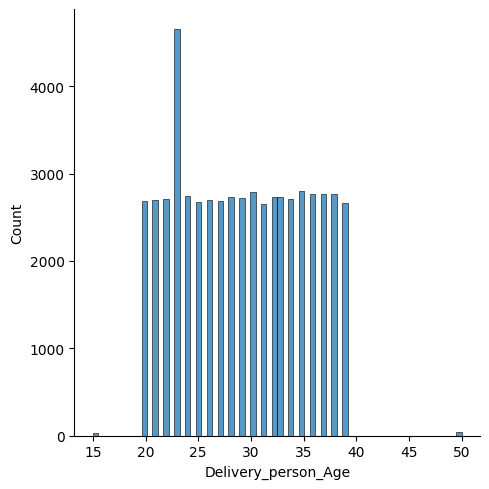

In [61]:
sns.displot(df['Delivery_person_Age'])


In [62]:
fig = px.histogram(df,'Delivery_person_Age') 
fig.show()

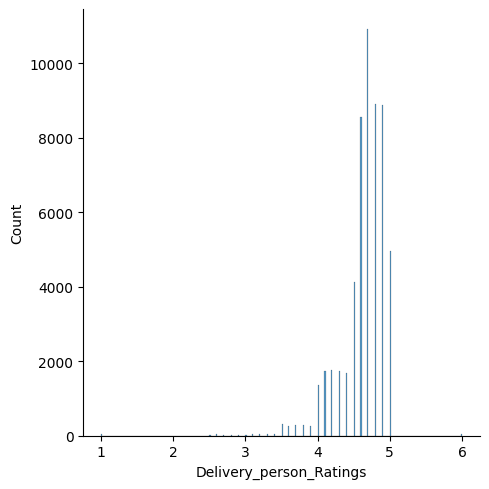

In [63]:
sns.displot(df['Delivery_person_Ratings'])


In [64]:
fig = px.histogram(df,'Delivery_person_Ratings') 
fig.show()

<Axes: xlabel='Type_of_order', ylabel='count'>

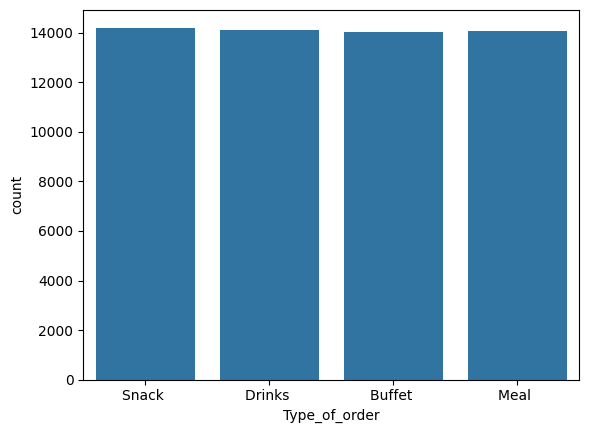

In [65]:
plt.figure(dpi=100)
sns.countplot(data=df,x='Type_of_order')

In [66]:
fig = px.histogram(df,'Type_of_order') 
fig.show()

<Axes: xlabel='Type_of_vehicle', ylabel='count'>

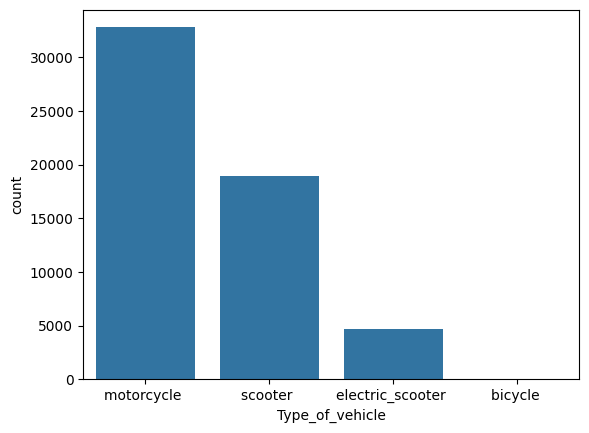

In [67]:
plt.figure(dpi=100)
sns.countplot(data=df,x='Type_of_vehicle')

<Axes: xlabel='City', ylabel='count'>

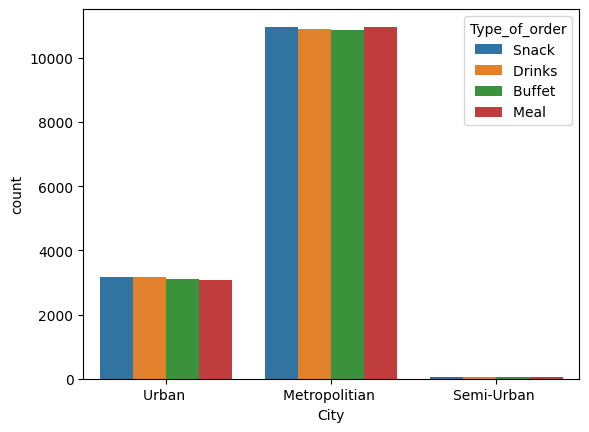

In [68]:
sns.countplot(x=df.City,hue=df.Type_of_order)


In [69]:
fig = px.histogram(df,'Delivery_person_Age') 
fig.show()

<Axes: xlabel='City', ylabel='count'>

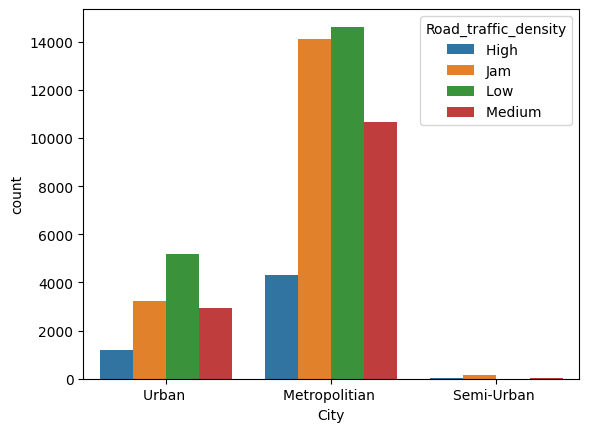

In [70]:
sns.countplot(x=df.City,hue=df.Road_traffic_density)


<Axes: xlabel='Type_of_order', ylabel='count'>

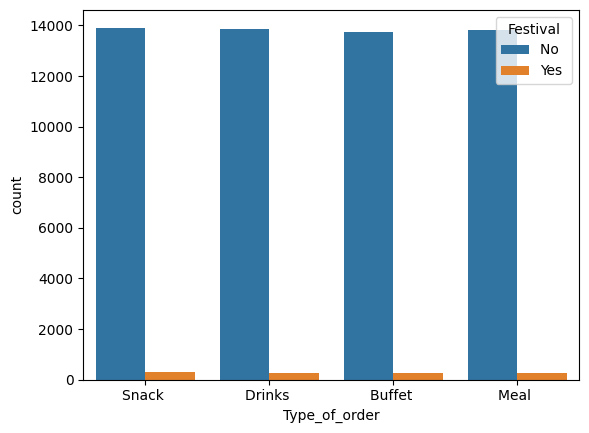

In [71]:
sns.countplot(x=df.Type_of_order,hue=df.Festival) #Festival doesn't affect the food ordering frequency

<Axes: xlabel='Vehicle_condition', ylabel='count'>

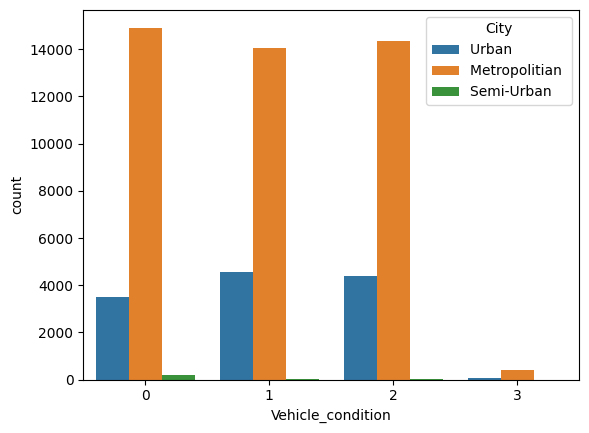

In [72]:
sns.countplot(x=df.Vehicle_condition,hue=df.City) #Vehicle condition is overall good in all 3 cities
#It has taken more time to deliver food in semi-urban cities, likely due to traffic or road conditions.

<Axes: xlabel='Time_taken(min)', ylabel='Density'>

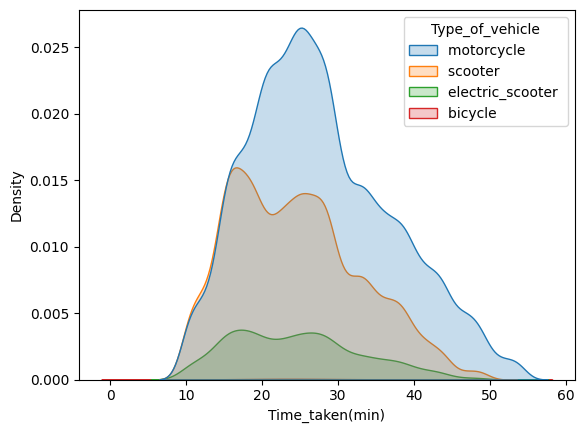

In [73]:
plt.figure(dpi=100)
sns.kdeplot(data=df,x='Time_taken(min)', hue='Type_of_vehicle', fill=True)
# most of the delivery is done through motorcycle and also have much higher mean delivery time compared to others

In [74]:
df['Time_category'].value_counts()

Time_category
evening      35292
afternoon    10078
morning       9444
night         1633
Name: count, dtype: int64

In [75]:
df['Hour'].value_counts()

Hour
22    5974
21    5941
18    5912
20    5887
23    5804
19    5774
17    4560
10    2568
9     2523
11    2499
8     1854
0     1633
12    1412
15    1100
14    1023
13     995
16     988
Name: count, dtype: int64

In [76]:
fig = px.histogram(df,'Hour') 
fig.show()

In [77]:
fig = px.histogram(df,'Time_category') 
fig.show()

In [78]:
px.pie(df, names='Time_category')


In [79]:
px.pie(df, names='Type_of_vehicle')


In [80]:
px.pie(df, names='Delivery_person_Age')


In [81]:
df.columns

Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Order_Date', 'Time_Order_picked',
       'Weatherconditions', 'Road_traffic_density', 'Vehicle_condition',
       'Type_of_order', 'Type_of_vehicle', 'multiple_deliveries', 'Festival',
       'City', 'Time_taken(min)', 'City_code', 'Time_Difference', 'distance',
       'day', 'month', 'day_of_week', 'is_weekend', 'Hour', 'Time_category'],
      dtype='object')

In [82]:
px.pie(df, names='day_of_week')


In [83]:
# Créer un dictionnaire de correspondance
jour_semaine = {0: 'Lundi', 1: 'Mardi', 2: 'Mercredi', 3: 'Jeudi', 4: 'Vendredi', 5: 'Samedi', 6: 'Dimanche'}

# Remplacer les valeurs numériques par les noms des jours de la semaine
df['day_of_week_name'] = df['day_of_week'].map(jour_semaine)

# Créer le graphique circulaire
fig = px.pie(df, names='day_of_week_name')

# Afficher le graphique
fig.show()

In [84]:
df['day_of_week'].value_counts()

day_of_week
2    8769
4    8720
3    7879
1    7871
0    7770
5    7766
6    7672
Name: count, dtype: int64

In [85]:
 # Group the data by 'is_weekend' and calculate the average time taken
avg_time_taken = df.groupby('is_weekend')['Time_taken(min)'].mean().round(2).reset_index()

# Create a bar chart using Plotly Express
fig = px.bar(avg_time_taken, x='is_weekend', y='Time_taken(min)', 
             title='Average Delivery Time on Weekdays vs Weekends',
             labels={'is_weekend': 'is_weekend', 'Time_taken(min)': 'Average Time Taken (minutes)'},
             text='Time_taken(min)')

# Show the plot
fig.show()

In [86]:
# Group the data by 'weatherconditions' and calculate the average time taken
avg_time_taken = df.groupby('Weatherconditions')['Time_taken(min)'].mean().round(2).reset_index()
avg_time_taken = avg_time_taken.sort_values(by='Time_taken(min)')

# Create a bar chart using Plotly Express
fig = px.bar(avg_time_taken, x='Weatherconditions', y='Time_taken(min)', 
             title='Average Delivery Time by weather conditions',
             labels={'Weatherconditions': 'Weather', 'Time_taken(min)': 'Average Time Taken (minutes)'},
             text='Time_taken(min)')

# Show the plot
fig.show() 

In [87]:

# Calculer le nombre de commandes chaque jour de la semaine
nombre_commandes_par_jour = df['day_of_week_name'].value_counts().sort_index()

# Calculer la moyenne du nombre de commandes
moyenne_nombre_commandes = nombre_commandes_par_jour.mean()

# Créer le graphique à barres
fig = go.Figure()

# Ajouter les barres pour le nombre de commandes chaque jour de la semaine
fig.add_trace(go.Bar(x=nombre_commandes_par_jour.index, y=nombre_commandes_par_jour.values, name='Nombre de commandes'))

# Ajouter la ligne pour la moyenne du nombre de commandes
fig.add_trace(go.Scatter(x=nombre_commandes_par_jour.index, y=[moyenne_nombre_commandes] * len(nombre_commandes_par_jour),
                         mode='lines', name='Moyenne du nombre de commandes', line=dict(color='red', width=3)))

# Mettre en forme le graphique
fig.update_layout(title='Nombre de commandes par jour de la semaine avec moyenne',
                  xaxis=dict(title='Jour de la semaine'),
                  yaxis=dict(title='Nombre de commandes'),
                  showlegend=True)

# Afficher le graphique
fig.show()


In [88]:
fig = px.histogram(df,'distance') 
fig.update_layout(yaxis=dict(range=[0, 6000]))  # Remplacez [0, 100] par vos limites désirées

# Afficher le graphique
fig.show()


In [89]:
df['Type_of_vehicle'].value_counts()

Type_of_vehicle
motorcycle           32790
scooter              18908
electric_scooter      4678
bicycle                 71
Name: count, dtype: int64